In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


### setup inline format style of tables

In [3]:
from IPython.core.display import HTML
css = open('style-table.css').read() + open('style-notebook.css').read()
HTML('<style>{}</style>'.format(css))

In [4]:
sns.set_palette("deep", desat=0.6)
sns.set_context(rc={"figure.figsize": (8,4)})

In [5]:
data = pd.read_csv('Data_Shared_WorkingFile.csv')
data.head()

,Entity,Run_On_Ent,Lot,Op,Error,Feature1,Feature2,Feature3,Feature4,Attribute1,Attribute2,Attribute3,Attribute4,Attribute5,Fam_Type,DIC_Design
0,201A,1,201AKMON,3514,NaN,250,70,1.5,4.0,0,1,0,0,1,NaN,NaN
1,201A,2,201AKMON,3514,NaN,250,70,1.5,4.0,0,1,0,0,1,NaN,NaN
2,201A,3,201AERAT,3504,NaN,600,15,3.0,8.0,1,0,0,0,0,NaN,NaN
3,201A,4,201AKMON,3514,NaN,250,70,1.5,4.0,0,1,0,0,1,NaN,NaN
4,201A,5,201AKMON,3514,NaN,250,70,1.5,4.0,0,1,0,0,1,NaN,NaN


### Create time series of a single Entity run (where we see Run_On_Ent restart at 1).  This will be used as our toy dataset.  

In [15]:
#create toy data sets by entity, we will work w toy7 which has the most rows and a very normal distribution
toy7_df = data.loc[data['Entity'] == '7A']
toy8_df = data.loc[data['Entity'] == '8A']
toy201_df = data.loc[data['Entity'] == '201A']
toy202_df = data.loc[data['Entity'] == '202A']
toy203_df = data.loc[data['Entity'] == '203A']
toy7_df

,Entity,Run_On_Ent,Lot,Op,Error,Feature1,Feature2,Feature3,Feature4,Attribute1,Attribute2,Attribute3,Attribute4,Attribute5,Fam_Type,DIC_Design
27805,7A,1,246186,3524,NaN,800,12,1.5,5.0,0,1,0,1,1,NaN,NaN
27806,7A,2,7A_CLEAN,3504,NaN,600,0,8.0,0.0,0,0,0,0,1,NaN,NaN
27807,7A,3,245352,3524,NaN,800,12,1.5,5.0,0,1,0,0,1,NaN,NaN
27808,7A,4,246782,3524,NaN,800,12,1.5,5.0,0,1,0,0,1,NaN,NaN
27809,7A,5,245739,3534,NaN,800,15,6.0,5.0,1,1,0,0,0,NaN,NaN
27810,7A,6,245927,3504,NaN,800,20,1.5,5.0,1,1,0,1,0,NaN,NaN
27811,7A,7,7AERAT,3504,NaN,600,15,3.0,8.0,1,0,0,0,0,NaN,NaN
27812,7A,8,7ACMON,3514,NaN,250,70,1.5,4.0,0,1,0,0,1,NaN,NaN
27813,7A,9,246621,3524,NaN,800,12,1.5,5.0,0,1,0,1,1,NaN,NaN
27814,7A,10,246676,3524,NaN,800,12,1.5,5.0,0,1,0,1,1,NaN,NaN


### the time series scatter plot is significant in that it shows a couple of significant things.  we can see the mean and variability are roughly stable throughout the life of the dataset.  Variance is homoscedastic although it may tighten slightly in the dataset after 15k.  Also, the customer's critical data does not actually start until roughly 4k data pts.  

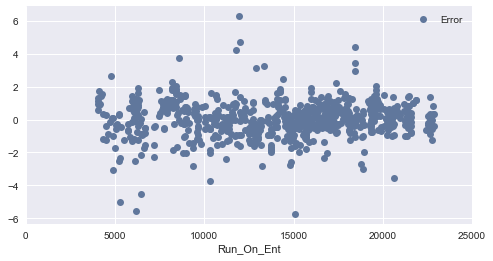

In [18]:
toy7_df.plot(x = 'Run_On_Ent', y = 'Error', xlim = [0, 25000], style = 'o')

### Begin data analysis by lagging all features and attributes from 1-20 lags and creating a new df from this combined with all the "Error" measurements in the toy7 dataset.  The lag was chosen with input from customer process data expert.  Experimental evidence points to lagging influence being confined to most preceding runs (possibly only several runs).  Therefore, we cap the lagging to 20 and increment by single runs.   Intitial analysis will be confined to exploring each attr/variable independantly, but later will expand to combinations.

In [19]:
#build a new dataframe that lags over each feature.  (default lag = 2 if none provided)
def FeatureLagging (datasystem, lag = 2, dropna = False):
    if type(datasystem) is pd.DataFrame:
        new_dict = {}
        for col_name in datasystem:
            if "Feature" in col_name or "Attribute" in col_name:
                new_dict[col_name] = datasystem[col_name]
                for xshift in range(1, lag + 1):
                    new_dict['%s_lag%d' % (col_name, xshift)] = datasystem[col_name].shift(xshift)
            else: 
                pass
            res = pd.DataFrame(new_dict, index = datasystem.index)
            
    else:
        print('error - must be 2D dataframe')
        return None

    if dropna == True:
        return res.dropna()
    else: return res


In [20]:
#use sequential run_on_ent as our row index
s = toy7_df.set_index('Run_On_Ent')
s.head()

,Entity,Lot,Op,Error,Feature1,Feature2,Feature3,Feature4,Attribute1,Attribute2,Attribute3,Attribute4,Attribute5,Fam_Type,DIC_Design
Run_On_Ent,,,,,,,,,,,,,,,
1,7A,246186,3524,NaN,800,12,1.5,5.0,0,1,0,1,1,NaN,NaN
2,7A,7A_CLEAN,3504,NaN,600,0,8.0,0.0,0,0,0,0,1,NaN,NaN
3,7A,245352,3524,NaN,800,12,1.5,5.0,0,1,0,0,1,NaN,NaN
4,7A,246782,3524,NaN,800,12,1.5,5.0,0,1,0,0,1,NaN,NaN
5,7A,245739,3534,NaN,800,15,6.0,5.0,1,1,0,0,0,NaN,NaN


In [21]:
#Use feature lagging function to shift all attributes/features and align with Error into a new df
lag7_df = FeatureLagging(s,lag=20,dropna=False)
lag7_df.insert(0, 'Error', s.Error)
lag7_df#.Error.describe()

,Error,Attribute1,Attribute1_lag1,Attribute1_lag10,Attribute1_lag11,Attribute1_lag12,Attribute1_lag13,Attribute1_lag14,Attribute1_lag15,Attribute1_lag16,...,Feature4_lag19,Feature4_lag2,Feature4_lag20,Feature4_lag3,Feature4_lag4,Feature4_lag5,Feature4_lag6,Feature4_lag7,Feature4_lag8,Feature4_lag9
Run_On_Ent,,,,,,,,,,,,,,,,,,,,,
1,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.0,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,5.0,NaN,0.0,5.0,NaN,NaN,NaN,NaN,NaN
6,NaN,1,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,5.0,NaN,5.0,0.0,5.0,NaN,NaN,NaN,NaN
7,NaN,1,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,5.0,NaN,5.0,5.0,0.0,5.0,NaN,NaN,NaN
8,NaN,0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,5.0,NaN,5.0,5.0,5.0,0.0,5.0,NaN,NaN
9,NaN,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,8.0,NaN,5.0,5.0,5.0,5.0,0.0,5.0,NaN


In [23]:
#new ndarray where we only look at row with 'Error' available and the corresponding lagged attributes from out matrix
lag7data_df = lag7_df.dropna()
lag7data_df

,Error,Attribute1,Attribute1_lag1,Attribute1_lag10,Attribute1_lag11,Attribute1_lag12,Attribute1_lag13,Attribute1_lag14,Attribute1_lag15,Attribute1_lag16,...,Feature4_lag19,Feature4_lag2,Feature4_lag20,Feature4_lag3,Feature4_lag4,Feature4_lag5,Feature4_lag6,Feature4_lag7,Feature4_lag8,Feature4_lag9
Run_On_Ent,,,,,,,,,,,,,,,,,,,,,
4031,0.929,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,5.0,5.0,5.0,4.00,5.0,4.00,5.0,4.0,5.0,8.0
4057,1.101,0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,...,4.0,5.0,4.0,5.00,4.0,5.00,5.0,4.0,5.0,5.0
4064,1.304,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,5.0,0.0,5.0,5.00,5.0,4.00,5.0,4.0,4.0,5.0
4066,0.599,0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,4.0,4.0,4.0,4.00,0.0,5.00,5.0,4.0,5.0,4.0
4121,1.738,0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,...,5.0,5.0,5.0,5.00,4.0,4.00,5.0,4.0,5.0,4.0
4132,0.878,0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,5.0,4.0,4.0,4.00,5.0,4.00,4.0,5.0,5.0,2.0
4172,0.930,0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,...,4.0,5.0,5.0,5.00,10.0,8.00,2.0,5.0,4.0,5.0
4204,1.408,0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,5.0,5.0,10.0,5.00,2.0,10.00,0.0,5.0,5.0,4.0
4269,1.525,0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,10.0,8.0,5.0,4.00,4.0,5.00,4.0,5.0,4.0,4.0


In [ ]:
from scipy import signal

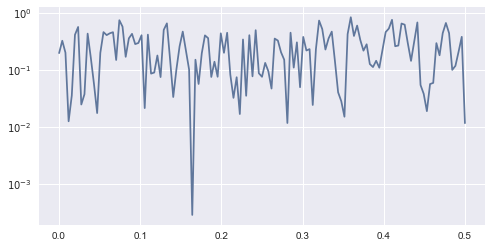

In [25]:
#single calculation check for coherence of Error and Attribute1_lag1 with sampling frequency of 1
f, Cxy = signal.coherence(lag7data_df.Error, lag7data_df.Attribute1_lag1, 1)
plt.semilogy(f, Cxy)
plt.show()


In [26]:
#single calculation of cross-correlation Error and Attribute1_lag1
numpy.correlate(lag7data_df.Error, lag7data_df.Attribute1_lag1)

array([ 20.9])

### Coherence and Cross Correlation Calculations

In [27]:
#loop through and calculate coherence matrix and cross correlation matrix of Error to each lagged attr/feature
coh_matrix = {}
cr_corr_matrix = {}

for col in lag7_df:
        if col != 'Error': #only compare Error to each lagged attribute, not itself
            coh_matrix[col] = signal.coherence(lag7data_df.Error, lag7data_df[col], 1)
            #print('loop=%d', col)
            cr_corr_matrix[col] = numpy.correlate(lag7data_df.Error,lag7data_df[col])
            

C:\Users\mabock\AppData\Local\Continuum\Anaconda3\lib\site-packages\scipy\signal\spectral.py:627: RuntimeWarning: invalid value encountered in true_divide
  Cxy = np.abs(Pxy)**2 / Pxx / Pyy


In [28]:
#show cross correlation matrix
cr_corr_matrix

{'Attribute1': array([ 0.]),
 'Attribute1_lag1': array([ 20.9]),
 'Attribute1_lag10': array([-5.971]),
 'Attribute1_lag11': array([-7.161]),
 'Attribute1_lag12': array([-14.362]),
 'Attribute1_lag13': array([-0.17]),
 'Attribute1_lag14': array([-16.99]),
 'Attribute1_lag15': array([-8.518]),
 'Attribute1_lag16': array([ 7.745]),
 'Attribute1_lag17': array([-3.027]),
 'Attribute1_lag18': array([ 17.162]),
 'Attribute1_lag19': array([ 15.058]),
 'Attribute1_lag2': array([-2.665]),
 'Attribute1_lag20': array([ 17.548]),
 'Attribute1_lag3': array([-14.411]),
 'Attribute1_lag4': array([ 7.747]),
 'Attribute1_lag5': array([-1.231]),
 'Attribute1_lag6': array([-0.773]),
 'Attribute1_lag7': array([ 10.266]),
 'Attribute1_lag8': array([ 6.544]),
 'Attribute1_lag9': array([ 16.276]),
 'Attribute2': array([ 13.349]),
 'Attribute2_lag1': array([ 8.097]),
 'Attribute2_lag10': array([ 15.429]),
 'Attribute2_lag11': array([ 24.893]),
 'Attribute2_lag12': array([ 6.997]),
 'Attribute2_lag13': array([-

In [29]:
#show coherence matrix
coh_matrix

{'Attribute1': (array([ 0.        ,  0.00390625,  0.0078125 ,  0.01171875,  0.015625  ,
          0.01953125,  0.0234375 ,  0.02734375,  0.03125   ,  0.03515625,
          0.0390625 ,  0.04296875,  0.046875  ,  0.05078125,  0.0546875 ,
          0.05859375,  0.0625    ,  0.06640625,  0.0703125 ,  0.07421875,
          0.078125  ,  0.08203125,  0.0859375 ,  0.08984375,  0.09375   ,
          0.09765625,  0.1015625 ,  0.10546875,  0.109375  ,  0.11328125,
          0.1171875 ,  0.12109375,  0.125     ,  0.12890625,  0.1328125 ,
          0.13671875,  0.140625  ,  0.14453125,  0.1484375 ,  0.15234375,
          0.15625   ,  0.16015625,  0.1640625 ,  0.16796875,  0.171875  ,
          0.17578125,  0.1796875 ,  0.18359375,  0.1875    ,  0.19140625,
          0.1953125 ,  0.19921875,  0.203125  ,  0.20703125,  0.2109375 ,
          0.21484375,  0.21875   ,  0.22265625,  0.2265625 ,  0.23046875,
          0.234375  ,  0.23828125,  0.2421875 ,  0.24609375,  0.25      ,
          0.25390625,  0

In [70]:
#show just a single loop of appending a tuple of PSD to a PSD matrix
PSD_matrix = []
f, Pxx_den = signal.welch(lag7data_df.Error, 1)
PSD_matrix.append(tuple((f, Pxx_den)))

f, Pxx_den = signal.welch(lag7data_df.Attribute1_lag1, 1)
PSD_matrix.append(tuple((f, Pxx_den)))

PSD_matrix

[(array([ 0.        ,  0.00390625,  0.0078125 ,  0.01171875,  0.015625  ,
          0.01953125,  0.0234375 ,  0.02734375,  0.03125   ,  0.03515625,
          0.0390625 ,  0.04296875,  0.046875  ,  0.05078125,  0.0546875 ,
          0.05859375,  0.0625    ,  0.06640625,  0.0703125 ,  0.07421875,
          0.078125  ,  0.08203125,  0.0859375 ,  0.08984375,  0.09375   ,
          0.09765625,  0.1015625 ,  0.10546875,  0.109375  ,  0.11328125,
          0.1171875 ,  0.12109375,  0.125     ,  0.12890625,  0.1328125 ,
          0.13671875,  0.140625  ,  0.14453125,  0.1484375 ,  0.15234375,
          0.15625   ,  0.16015625,  0.1640625 ,  0.16796875,  0.171875  ,
          0.17578125,  0.1796875 ,  0.18359375,  0.1875    ,  0.19140625,
          0.1953125 ,  0.19921875,  0.203125  ,  0.20703125,  0.2109375 ,
          0.21484375,  0.21875   ,  0.22265625,  0.2265625 ,  0.23046875,
          0.234375  ,  0.23828125,  0.2421875 ,  0.24609375,  0.25      ,
          0.25390625,  0.2578125 ,  0.

### Power Spectral Density calculations

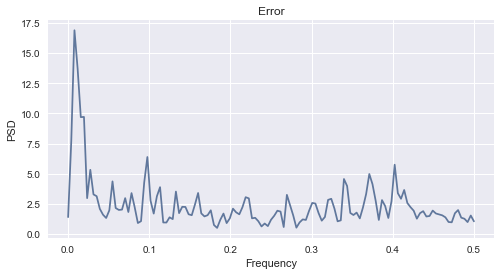

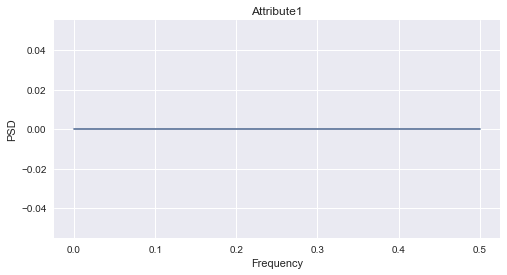

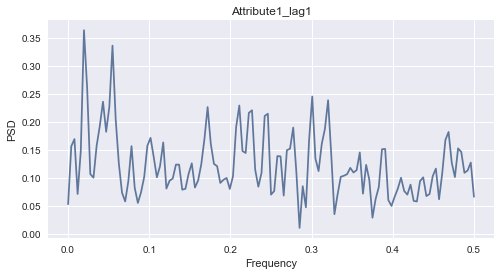

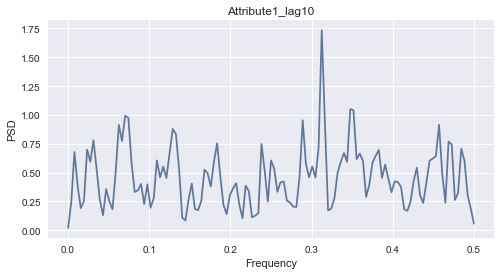

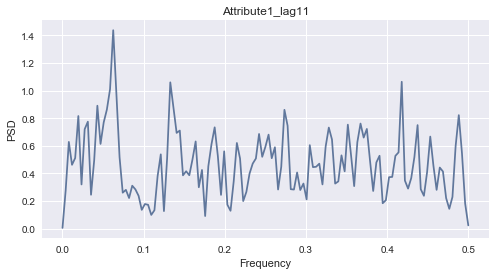

...

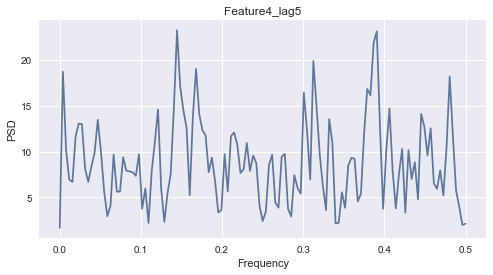

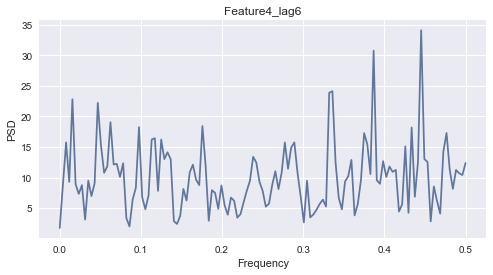

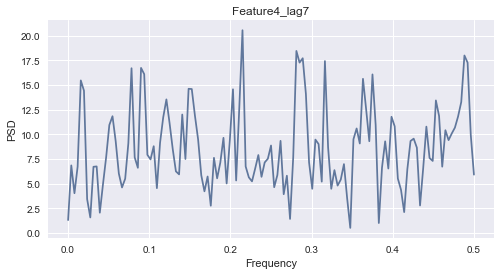

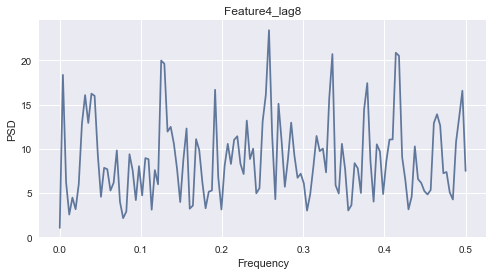

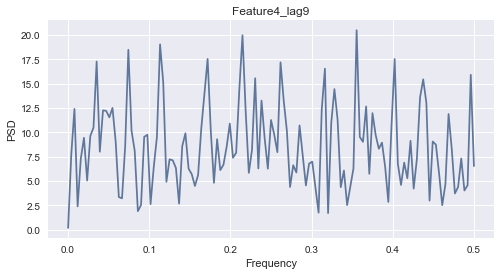

In [85]:
PSD_matrix = []

for col in lag7_df:
        #Welch's method to estimate power spectral density
        f, Pxx_den = signal.welch(lag7data_df[col], 1)
        PSD_matrix.append(tuple((f, Pxx_den)))
        plt.plot(f, Pxx_den)
        plt.title(col)
        plt.ylabel('PSD')
        plt.xlabel('Frequency')
        plt.show()
            
#PSD_matrix

### Scratch work to fin max value in each array at frequency

In [139]:
#Coherence of Attr1_lag3 and Error
f, Cxy = signal.coherence(lag7data_df.Error, lag7data_df.Attribute1_lag3, 1)
#plt.semilogy(f, Cxy)
#plt.show()
Cxy#.size

array([  3.67073485e-03,   3.85787522e-02,   1.22684330e-01,
         2.43783507e-01,   2.27604999e-02,   5.19175458e-02,
         1.42288599e-01,   6.60185881e-03,   5.85523261e-01,
         2.71039684e-01,   1.42106998e-01,   1.07301113e-01,
         4.55513824e-01,   5.94093247e-01,   3.33781188e-01,
         1.01060450e-01,   4.11882008e-01,   2.50174424e-01,
         3.08515228e-03,   8.51685216e-02,   4.14570761e-01,
         1.67475489e-01,   2.66810940e-01,   1.02795494e-03,
         3.69577196e-02,   3.35822029e-01,   2.26247128e-01,
         1.59537304e-01,   1.27044008e-01,   1.82182407e-01,
         1.38432059e-01,   3.24529301e-02,   2.25485051e-03,
         4.00844489e-01,   1.26577946e-01,   7.52757134e-02,
         2.54709431e-01,   7.89740456e-01,   3.48495375e-01,
         3.97081872e-01,   5.65139000e-01,   2.74156643e-01,
         7.56535011e-03,   5.34248984e-01,   1.51766687e-01,
         5.36836548e-01,   5.29085521e-01,   3.14219383e-02,
         4.93467303e-01,

In [115]:
#Power spectral density of Error
f, Pxx_den_E = signal.welch(lag7data_df.Error, 1)
#plt.plot(f, Pxx_den)
#plt.show()
Pxx_den_E#.size

array([  1.39456867,   7.73191334,  16.90031725,  13.71079776,
         9.69118837,   9.70534109,   2.96565707,   5.31965341,
         3.27796908,   3.1280986 ,   2.08008925,   1.59589505,
         1.31926517,   1.95929646,   4.35877682,   2.14900274,
         1.98775594,   2.01790945,   2.9680293 ,   1.81740777,
         3.38565387,   2.20931343,   0.90233268,   1.05601831,
         4.26472033,   6.38176561,   2.75893779,   1.68633279,
         3.12339824,   3.87899665,   0.94896913,   0.9444365 ,
         1.37742978,   1.22606355,   3.51423946,   1.72312896,
         2.24880036,   2.23560264,   1.6296947 ,   1.55202638,
         2.43229025,   3.39622582,   1.70356365,   1.45249511,
         1.5521854 ,   1.95871886,   0.73955099,   0.49693791,
         1.17023608,   1.68703793,   0.89723932,   1.28945397,
         2.09426003,   1.7886082 ,   1.62590752,   2.22414321,
         3.04671994,   2.94847832,   1.29370141,   1.33618767,
         1.05309764,   0.62003496,   0.86214706,   0.64

In [116]:
#Power spectral density of Attribute1 with lag3
f, Pxx_den_A1L3 = signal.welch(lag7data_df.Attribute1_lag3, 1)
Pxx_den_A1L3

array([ 0.25486279,  1.2055205 ,  1.11110813,  0.70463773,  0.59196148,
        0.6619792 ,  0.69242412,  0.54191834,  0.62177739,  0.28620795,
        0.38137471,  0.50290609,  0.87836703,  0.76908605,  0.67844015,
        0.55800196,  0.51482102,  0.46363925,  0.51795939,  0.72821711,
        0.5741925 ,  0.88357141,  1.05560007,  0.38422202,  0.1670309 ,
        0.18930216,  0.37113998,  0.23655254,  0.25563068,  0.31252926,
        0.41144287,  0.42911188,  0.45780037,  0.24792803,  0.23643074,
        0.36167226,  0.28596558,  0.41934308,  0.44247492,  0.4925619 ,
        0.45242808,  0.34688773,  0.43349037,  0.65377644,  0.6022305 ,
        0.29826961,  0.43187832,  0.57022713,  0.67207125,  0.22614583,
        0.33466084,  0.36483844,  0.18137805,  0.21501221,  0.16067816,
        0.34271619,  0.45577491,  0.17854872,  0.18592759,  0.48258968,
        0.52239956,  0.1720118 ,  0.24242652,  0.56884254,  0.28074552,
        0.08388866,  0.09878378,  0.08856524,  0.51301766,  0.95

In [118]:
#Top 5 A1L3 frequencies and values
ind_A1L3 = np.argpartition(Pxx_den_A1L3,-5)[-5:]
ind_A1L3

array([124,  22, 123,   2,   1], dtype=int64)

In [119]:
Pxx_den_A1L3[ind_A1L3]

array([ 1.03807777,  1.05560007,  1.09338754,  1.11110813,  1.2055205 ])

In [120]:
#Top 5 Error frequencies and values
ind_E = np.argpartition(Pxx_den_E,-5)[-5:]
ind_E

array([1, 4, 5, 3, 2], dtype=int64)

In [121]:
Pxx_den_E[ind_E]

array([  7.73191334,   9.69118837,   9.70534109,  13.71079776,  16.90031725])

In [165]:
#find intersection
intersect = set(ind_A1L3).intersection(ind_E)
intersect

{1, 2}

In [166]:
#Sample of weights for first 2 freqs in the intersection of Error and A1L3
weights = []
for i in intersect:
    weights.append(Pxx_den_E[i]*Pxx_den_A1L3[i] / 2)
weights


[4.660490031985062, 9.3890399254460615]

In [167]:
weighted_Coh = []
for i in intersect:
    weighted_Coh.append(Pxx_den_E[i]*Pxx_den_A1L3[i] / 2 * Cxy[i] / sum(weights))
weighted_Coh


[0.012797288627164203, 0.081987659086931786]

### Cross Power Spectral Density Pxy using Welch's for Error to each attr/feature column

C:\Users\mabock\AppData\Local\Continuum\Anaconda3\lib\site-packages\numpy\core\numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


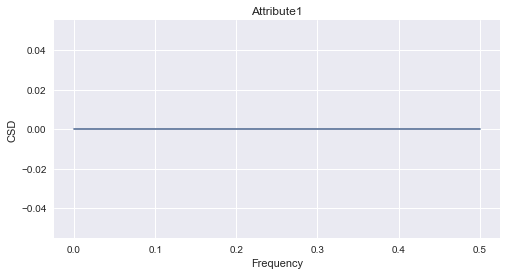

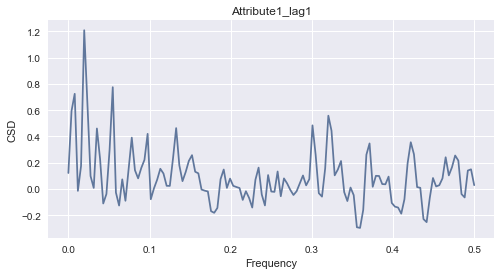

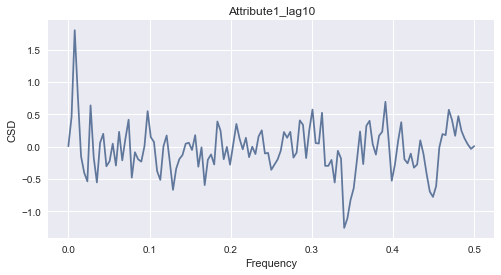

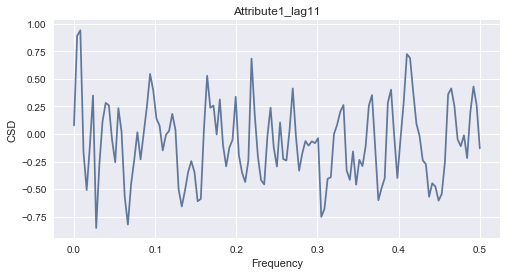

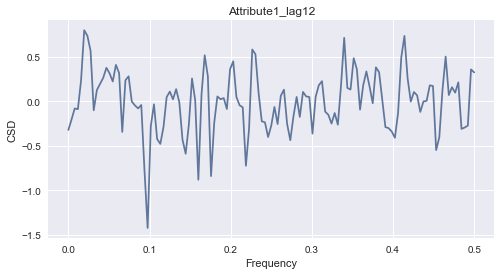

...

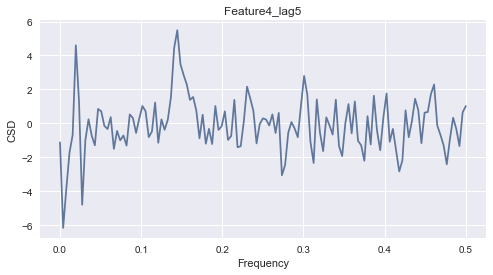

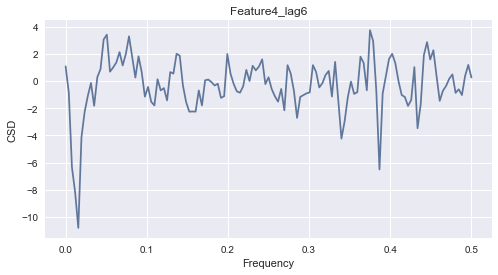

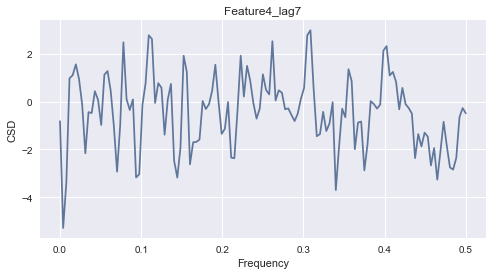

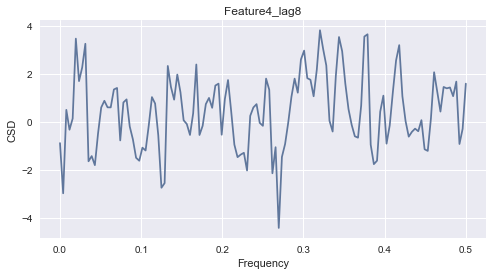

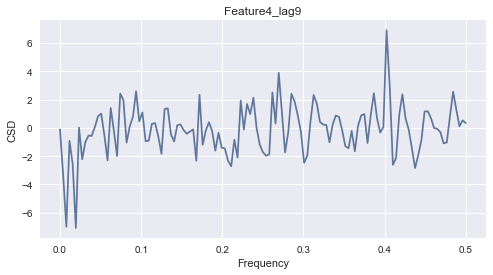

[(array([ 0.        ,  0.00390625,  0.0078125 ,  0.01171875,  0.015625  ,
          0.01953125,  0.0234375 ,  0.02734375,  0.03125   ,  0.03515625,
          0.0390625 ,  0.04296875,  0.046875  ,  0.05078125,  0.0546875 ,
          0.05859375,  0.0625    ,  0.06640625,  0.0703125 ,  0.07421875,
          0.078125  ,  0.08203125,  0.0859375 ,  0.08984375,  0.09375   ,
          0.09765625,  0.1015625 ,  0.10546875,  0.109375  ,  0.11328125,
          0.1171875 ,  0.12109375,  0.125     ,  0.12890625,  0.1328125 ,
          0.13671875,  0.140625  ,  0.14453125,  0.1484375 ,  0.15234375,
          0.15625   ,  0.16015625,  0.1640625 ,  0.16796875,  0.171875  ,
          0.17578125,  0.1796875 ,  0.18359375,  0.1875    ,  0.19140625,
          0.1953125 ,  0.19921875,  0.203125  ,  0.20703125,  0.2109375 ,
          0.21484375,  0.21875   ,  0.22265625,  0.2265625 ,  0.23046875,
          0.234375  ,  0.23828125,  0.2421875 ,  0.24609375,  0.25      ,
          0.25390625,  0.2578125 ,  0.

In [93]:
CSD_matrix = []

for col in lag7_df:
        if col != 'Error': #only compare Error to each lagged attribute, not itself
            f, Pxy = signal.csd(lag7data_df.Error, lag7data_df[col], 1)
            CSD_matrix.append(tuple((f, Pxy)))
            #print('loop=%d', col)
            plt.plot(f, Pxy)
            plt.title(col)
            plt.ylabel('CSD')
            plt.xlabel('Frequency')
            plt.show()

CSD_matrix
